



## Data Science & Business Analytics
## Task - Exploratory data analysis
## Triyambaka Mishra

### The aim of this notebook is to explore the terrorist events around the world. 
### Interactive Plots and Animations are used in this notebook, for making the exploration easy and more informative. 
Geography: Worldwide

Time period: 1970-2017, except 1993

Unit of analysis: Attack

Variables: >100 variables on location, tactics, perpetrators, targets, and outcomes



Definition of terrorism:

"The threatened or actual use of illegal force and violence by a non-state actor to attain a political, economic, religious, or social goal through fear, coercion, or intimidation."

 

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import numpy as np
import warnings
warnings.filterwarnings('ignore')
!pip install plotly 
import plotly.express as px
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

### Getting data ready for analyzation 

In [2]:
terror =pd.read_csv("C:/Users/DELL/OneDrive/Desktop/Verzeo Minor Project/globalterrorismdb_0718dist.csv",encoding='cp1252')


In [3]:
terror.describe()

,eventid,iyear,imonth,iday,extended,country,region,latitude,longitude,specificity,...,ransomamt,ransomamtus,ransompaid,ransompaidus,hostkidoutcome,nreleased,INT_LOG,INT_IDEO,INT_MISC,INT_ANY
count,1.816910e+05,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,177135.000000,1.771340e+05,181685.000000,...,1.350000e+03,5.630000e+02,7.740000e+02,552.000000,10991.000000,10400.000000,181691.000000,181691.000000,181691.000000,181691.000000
mean,2.002704e+11,2002.638997,6.467277,15.505644,0.045346,131.968501,7.160938,23.498343,-4.586957e+02,1.451452,...,3.172530e+06,5.784865e+05,7.179437e+05,240.378623,4.629242,-29.018269,-4.543731,-4.464398,0.090010,-3.945952
std,1.325955e+09,13.259430,3.388303,8.814045,0.208063,112.414535,2.933408,18.569242,2.047790e+05,0.995430,...,3.021157e+07,7.077924e+06,1.014392e+07,2940.967293,2.035360,65.720119,4.543547,4.637152,0.568457,4.691325
min,1.970000e+11,1970.000000,0.000000,0.000000,0.000000,4.000000,1.000000,-53.154613,-8.618590e+07,1.000000,...,-9.900000e+01,-9.900000e+01,-9.900000e+01,-99.000000,1.000000,-99.000000,-9.000000,-9.000000,-9.000000,-9.000000
25%,1.991020e+11,1991.000000,4.000000,8.000000,0.000000,78.000000,5.000000,11.510046,4.545640e+00,1.000000,...,0.000000e+00,0.000000e+00,-9.900000e+01,0.000000,2.000000,-99.000000,-9.000000,-9.000000,0.000000,-9.000000
50%,2.009020e+11,2009.000000,6.000000,15.000000,0.000000,98.000000,6.000000,31.467463,4.324651e+01,1.000000,...,1.500000e+04,0.000000e+00,0.000000e+00,0.000000,4.000000,0.000000,-9.000000,-9.000000,0.000000,0.000000
75%,2.014080e+11,2014.000000,9.000000,23.000000,0.000000,160.000000,10.000000,34.685087,6.871033e+01,1.000000,...,4.000000e+05,0.000000e+00,1.273412e+03,0.000000,7.000000,1.000000,0.000000,0.000000,0.000000,0.000000
max,2.017120e+11,2017.000000,12.000000,31.000000,1.000000,1004.000000,12.000000,74.633553,1.793667e+02,5.000000,...,1.000000e+09,1.320000e+08,2.750000e+08,48000.000000,7.000000,2769.000000,1.000000,1.000000,1.000000,1.000000


In [4]:
terror.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Columns: 135 entries, eventid to related
dtypes: float64(56), int64(21), object(58)
memory usage: 187.1+ MB


In [5]:
terror.shape

(181691, 135)

In [6]:
## As we can see there are 135 coloums but in order to get an effective model prediction we need remove the repeted coloums
# Also we need to remove colums which are highly correlatted
# we can check corelation with help of 
terror.corr()

,eventid,iyear,imonth,iday,extended,country,region,latitude,longitude,specificity,...,ransomamt,ransomamtus,ransompaid,ransompaidus,hostkidoutcome,nreleased,INT_LOG,INT_IDEO,INT_MISC,INT_ANY
eventid,1.000000,0.999996,0.002705,0.018270,0.091762,-0.135039,0.401371,0.166886,0.003907,0.030641,...,-0.009991,-0.017999,-0.014094,-0.165422,0.256114,-0.181613,-0.143600,-0.133252,-0.077851,-0.175606
iyear,0.999996,1.000000,0.000139,0.018254,0.091754,-0.135023,0.401384,0.166933,0.003917,0.030626,...,-0.009984,-0.018216,-0.014238,-0.165375,0.256092,-0.181556,-0.143601,-0.133253,-0.077847,-0.175596
imonth,0.002705,0.000139,1.000000,0.005497,-0.000468,-0.006305,-0.002999,-0.015978,-0.003880,0.003621,...,-0.000710,0.046989,0.058878,-0.016597,0.011295,-0.011535,-0.002302,-0.002034,-0.002554,-0.006336
iday,0.018270,0.018254,0.005497,1.000000,-0.004700,0.003468,0.009710,0.003423,-0.002285,-0.006991,...,0.012755,-0.010502,0.003148,-0.006581,-0.006706,0.001765,-0.001540,-0.001621,-0.002027,-0.001199
extended,0.091762,0.091754,-0.000468,-0.004700,1.000000,-0.020466,0.038389,-0.024749,0.000523,0.057897,...,-0.008114,0.028177,0.001966,0.009367,0.233293,-0.192155,0.071768,0.075147,0.027335,0.080767
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
nreleased,-0.181613,-0.181556,-0.011535,0.001765,-0.192155,-0.044331,-0.149511,0.002790,-0.017745,-0.030631,...,0.054571,0.034843,0.049322,0.016832,-0.555478,1.000000,0.039388,0.040947,0.085055,0.064759
INT_LOG,-0.143600,-0.143601,-0.002302,-0.001540,0.071768,0.069904,-0.082584,-0.099827,0.002272,0.073022,...,0.035821,0.031079,0.007029,-0.045504,-0.015442,0.039388,1.000000,0.996211,0.052537,0.891051
INT_IDEO,-0.133252,-0.133253,-0.002034,-0.001621,0.075147,0.067564,-0.071917,-0.094470,0.002268,0.071333,...,0.039053,0.041983,0.013162,-0.039844,-0.016234,0.040947,0.996211,1.000000,0.082014,0.893811
INT_MISC,-0.077851,-0.077847,-0.002554,-0.002027,0.027335,0.207281,0.043139,0.097652,0.000371,-0.019197,...,0.023815,0.125162,0.037227,0.129274,-0.119776,0.085055,0.052537,0.082014,1.000000,0.252193


### After going through this correlational matrix we will eleminate some coloums
#### And take into account the coloums of interest

In [7]:


terror.rename(columns={'iyear':'Year','imonth':'Month','iday':'Day','country_txt':'Country','region_txt':'Region','attacktype1_txt':'AttackType','target1':'Target','nkill':'Killed','nwound':'Wounded','summary':'Summary','gname':'Group','targtype1_txt':'Target_type','weaptype1_txt':'Weapon_type','motive':'Motive'},inplace=True)
terror=terror[['Year','Month','Day','Country','Region','city','latitude','longitude','AttackType','Killed','Wounded','Target','Summary','Group','Target_type','Weapon_type','Motive',"success"]]
terror['casualities']=terror['Killed']+terror['Wounded']
terror.head(3)

,Year,Month,Day,Country,Region,city,latitude,longitude,AttackType,Killed,Wounded,Target,Summary,Group,Target_type,Weapon_type,Motive,success,casualities
0,1970,7,2,Dominican Republic,Central America & Caribbean,Santo Domingo,18.456792,-69.951164,Assassination,1.0,0.0,Julio Guzman,NaN,MANO-D,Private Citizens & Property,Unknown,NaN,1,1.0
1,1970,0,0,Mexico,North America,Mexico city,19.371887,-99.086624,Hostage Taking (Kidnapping),0.0,0.0,"Nadine Chaval, daughter",NaN,23rd of September Communist League,Government (Diplomatic),Unknown,NaN,1,0.0
2,1970,1,0,Philippines,Southeast Asia,Unknown,15.478598,120.599741,Assassination,1.0,0.0,Employee,NaN,Unknown,Journalists & Media,Unknown,NaN,1,1.0


In [8]:
# some basic cleaning of data 
terror.isnull().sum()

Year                0
Month               0
Day                 0
Country             0
Region              0
city              434
latitude         4556
longitude        4557
AttackType          0
Killed          10313
Wounded         16311
Target            636
Summary         66129
Group               0
Target_type         0
Weapon_type         0
Motive         131130
success             0
casualities     16874
dtype: int64

In [9]:
print('Country with Highest Terrorist Attacks:',terror['Country'].value_counts().index[0])
print('Regions with Highest Terrorist Attacks:',terror['Region'].value_counts().index[0])
print('Maximum people killed in an attack are:',terror['Killed'].max(),'that took place in',terror.loc[terror['Killed'].idxmax()].Country)

Country with Highest Terrorist Attacks: Iraq
Regions with Highest Terrorist Attacks: Middle East & North Africa
Maximum people killed in an attack are: 1570.0 that took place in Iraq


In [10]:


def countplot(x,y):
    """
        This is count plot funtion 
        for analylzing data more efficiently 
    """
    plt.subplots(figsize=(20,6))
   
   
    total = float(len(terror))
    ax = sns.countplot(x=x,data=terror,palette='RdYlGn',edgecolor=sns.color_palette('dark',7))
    plt.title(y, fontsize=20)
    for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/total)
        x = p.get_x() + p.get_width()
        y = p.get_height()
        ax.annotate(percentage, (x, y),ha='right',
rotation = +45,fontweight ='bold')
    ax.grid(b = True, color ='grey',
        linestyle ='-.', linewidth = 1,
        alpha = 0.2)
    plt.xticks(rotation=90)
    plt.show()

    
    
    
    

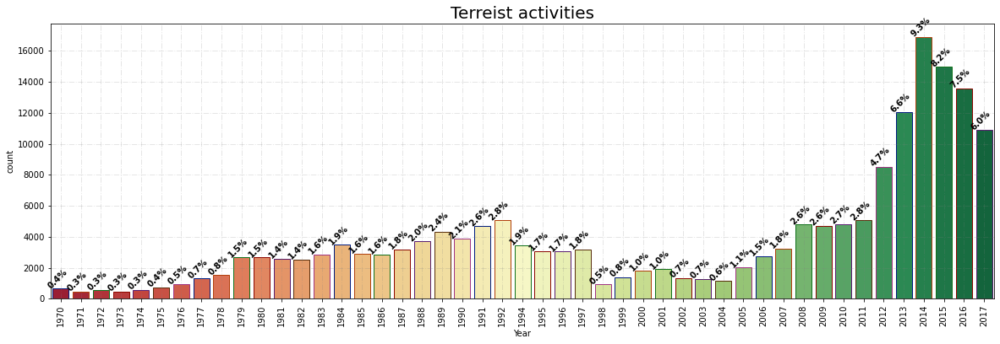

In [11]:
countplot(terror['Year'], "Terreist activities")

#### The data suggests that the terror has increased in from 2008

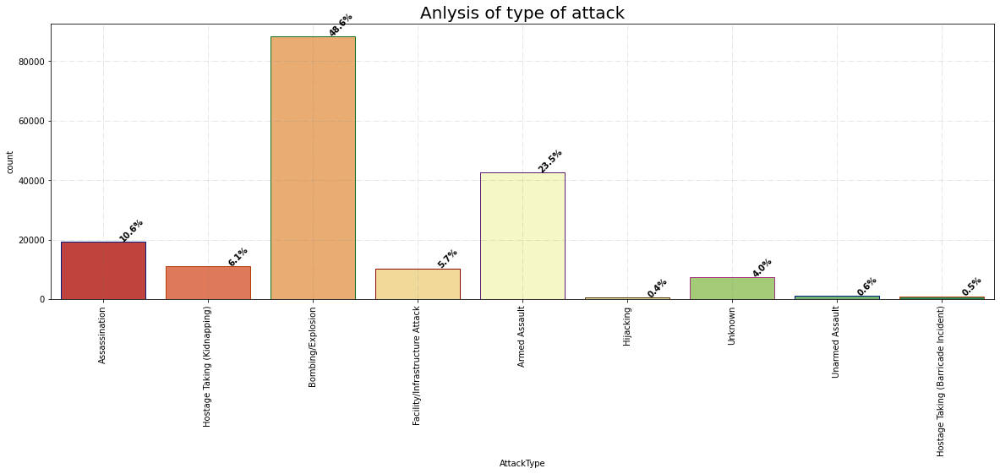

In [12]:
# Analyzation of the type of attck that could have taken place 

countplot(terror['AttackType'], "Anlysis of type of attack")

In [13]:
weapons = terror['Weapon_type'].value_counts()
weapons = pd.DataFrame(weapons)

weapons.reset_index(level=0, inplace=True)
weapons.columns = ['Weapon used', 'Weapon Count']
weapons

,Weapon used,Weapon Count
0,Explosives,92426
1,Firearms,58524
2,Unknown,15157
3,Incendiary,11135
4,Melee,3655
5,Chemical,321
6,Sabotage Equipment,141
7,Vehicle (not to include vehicle-borne explosiv...,136
8,Other,114
9,Biological,35


#### We can clearly see that Bomboing/Explotion is the major attack type used to harm the masses


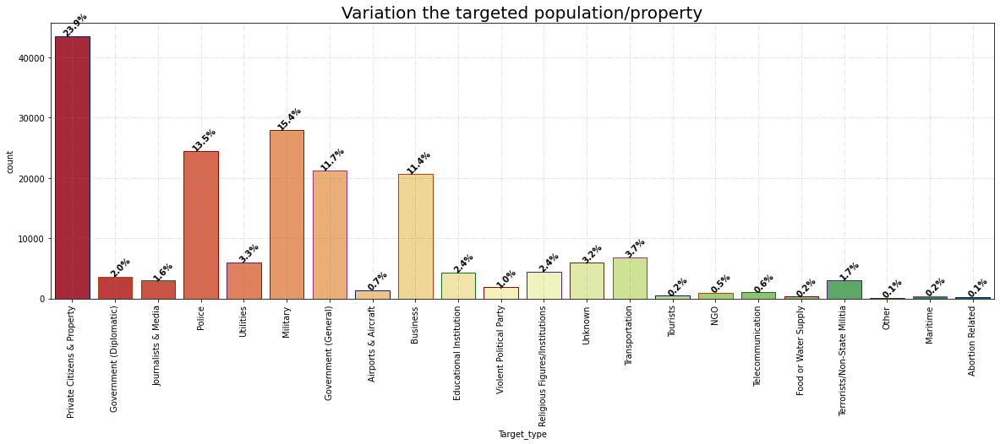

In [14]:
countplot(terror['Target_type'], "Variation the targeted population/property")

### we can point out that civilians are the main targets 

### Analyzation on the basis of region and trents they follow

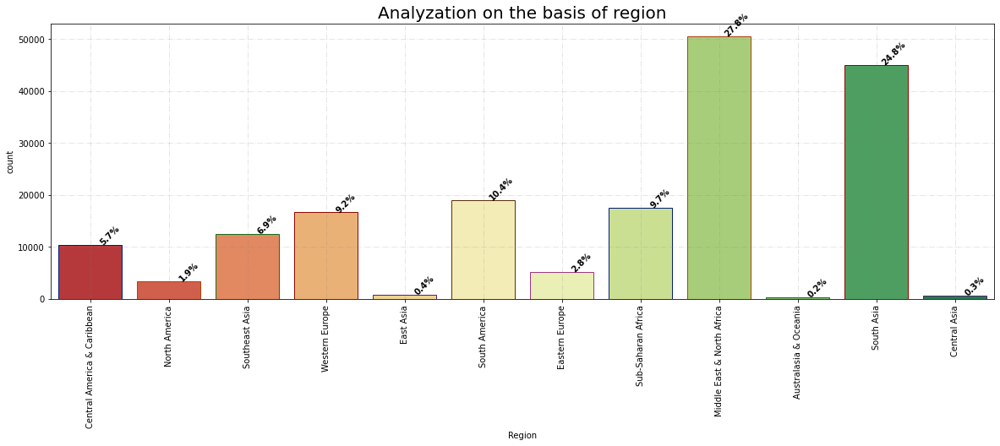

In [15]:
countplot(terror["Region"],"Analyzation on the basis of region")

Middle East and North Africa are the most terrorism prone regions followed by South Asia. The Australian Region have experienced very few terrorist events. 

####  Types of Attack in various regions

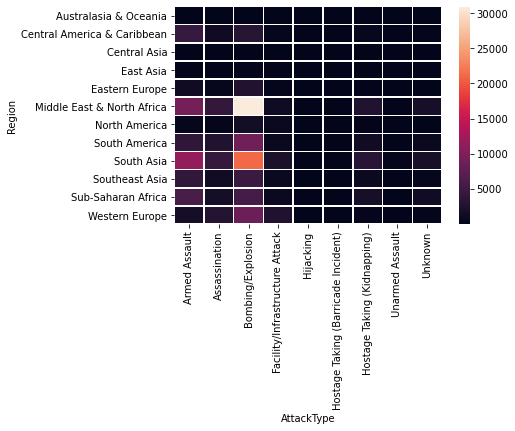

In [16]:
reg_type = pd.crosstab(terror.Region,terror.AttackType)
ax = sns.heatmap(reg_type,linewidths=.5)

It is evident that armed assault and bombing are the 2 major attacktyped in the various region 


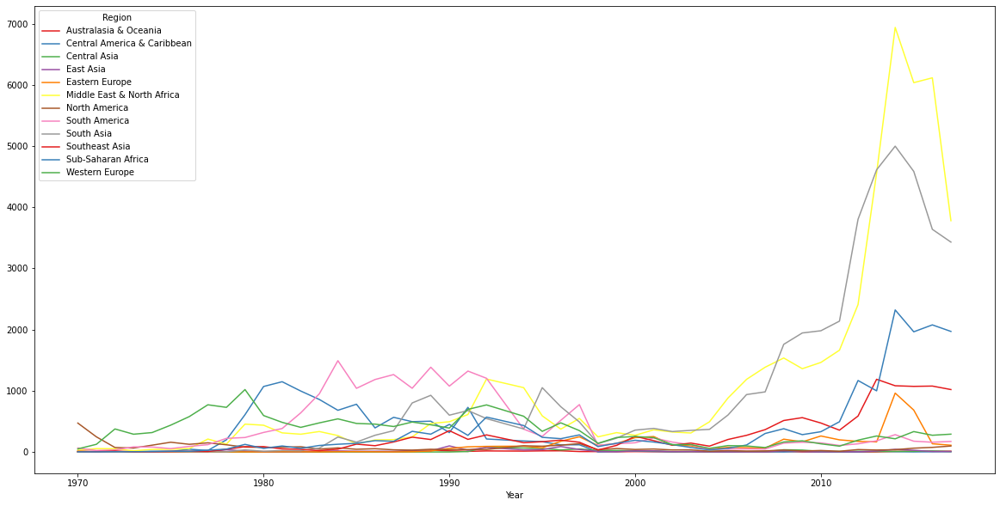

In [17]:
terror_region=pd.crosstab(terror.Year,terror.Region)
terror_region.plot(color=sns.color_palette('Set1',12))

fig=plt.gcf()
fig.set_size_inches(20,10)
plt.show()


### Most affected regions are 
    1. Middle-East & North America
    2. South Asia 
    3. Sub-Saharan Africa
    

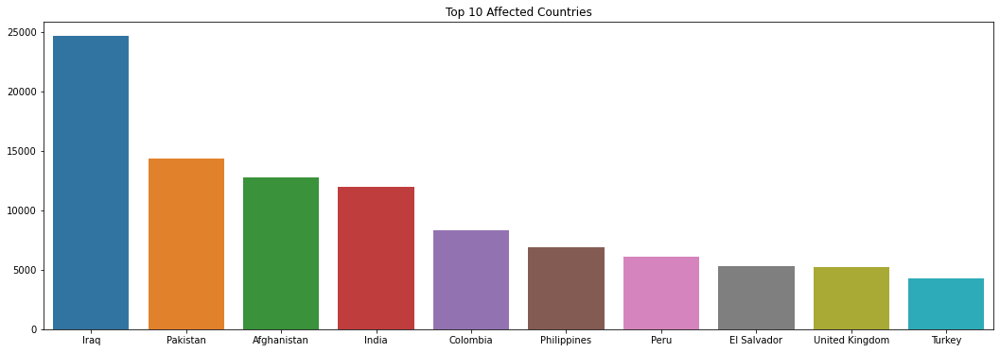

In [18]:
## Ten most affected countries via these attacks over the yeras 
plt.subplots(figsize=(18,6))
sns.barplot(terror['Country'].value_counts()[:10].index,terror['Country'].value_counts()[:10].values)
plt.title('Top 10 Affected Countries')
plt.show()


## The list of 10 most affected countries are 
        1. IRAQ
        2. PAKISTAN
        3. AFGANISTAN
        4. INDIA
        5. COLOMBIA
        6. Philippines
        7. PERU
        8. EL SALVDOE
        9. UNITED KINGDOM 
        10.TURKEY

### Attacks vs Deaths in the most affected countries

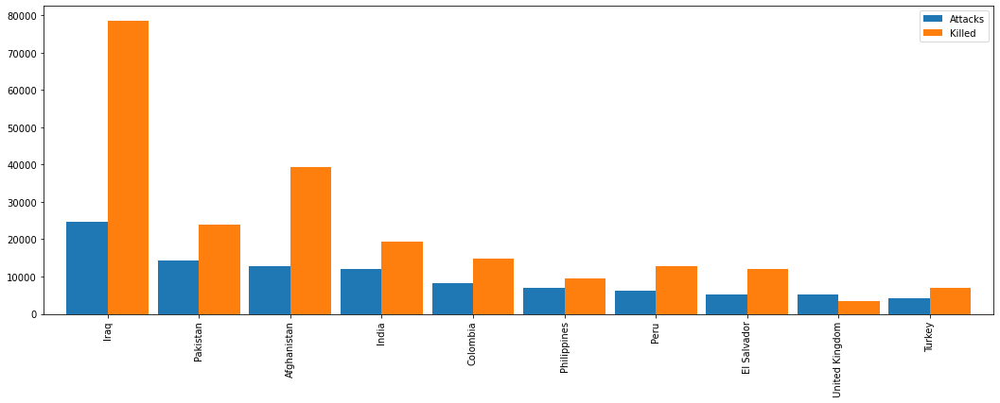

In [19]:

coun_terror=terror['Country'].value_counts()[:10].to_frame()
coun_terror.columns=['Attacks']
coun_kill=terror.groupby('Country')['Killed'].sum().to_frame()
coun_terror.merge(coun_kill,left_index=True,right_index=True,how='left').plot.bar(width=0.9)
fig=plt.gcf()
fig.set_size_inches(18,6)
plt.show()

#### Sucessfull/ Unsucessfull attacks

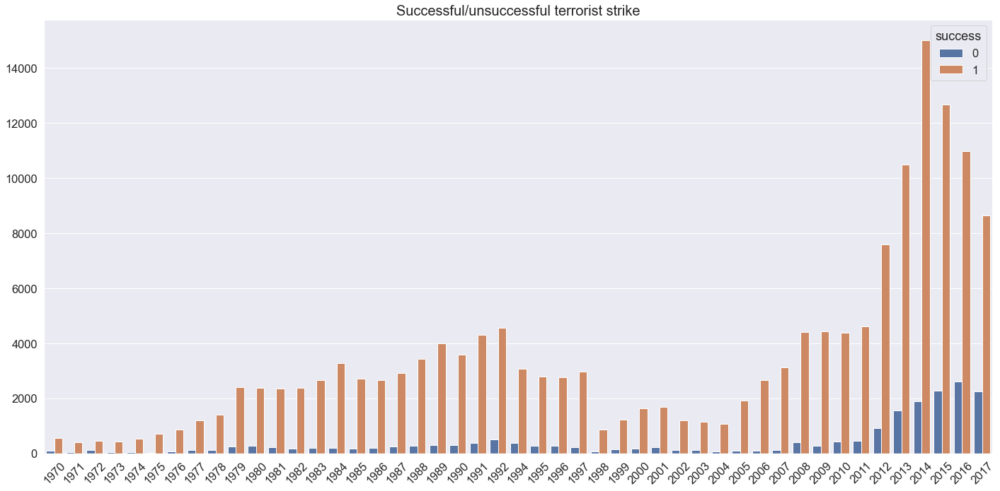

In [20]:
# for analyzation of the Sucessfull/ Unsucessfull attacks
sns.set(font_scale=1.5)
fig = plt.figure(figsize=(20,10))

sns.countplot(x='Year', data=terror, hue='success', orient='v');

    
plt.xlabel('')
plt.ylabel('')
plt.title('Successful/unsuccessful terrorist strike', fontsize=20)
plt.xticks(rotation = 45)
plt.tight_layout()

#### The Successful rate has remianed high over the years 

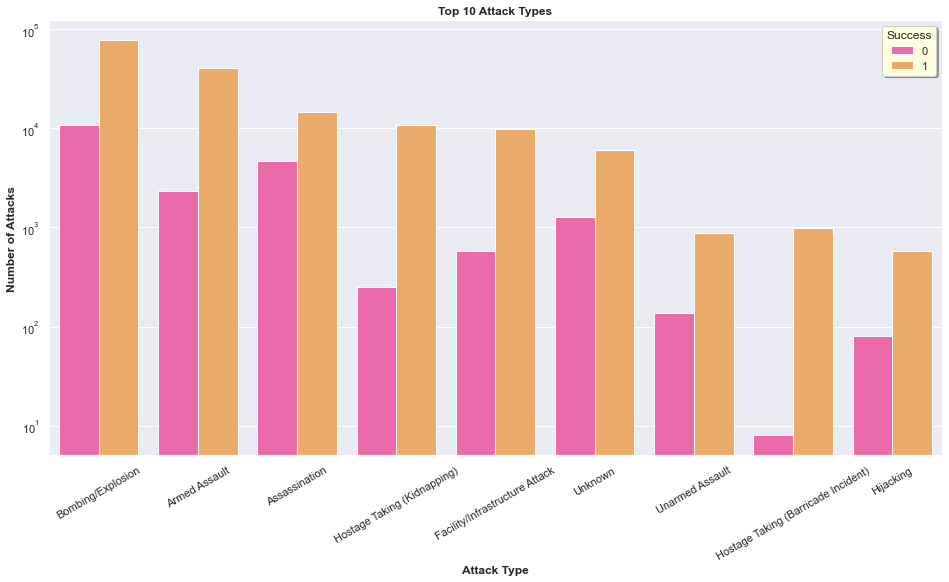

In [21]:
plt.figure(figsize=(16,8))
sns.set(style='darkgrid')
sns.countplot(x='AttackType', hue='success', data = terror, order=terror['AttackType'].value_counts().index, palette="spring")
plt.yscale('log')
plt.ylabel("Number of Attacks", weight='bold')
plt.xlabel("Attack Type", weight='bold')
plt.legend(title='Success', shadow=True, facecolor='lightyellow')
plt.xticks(rotation=30)
plt.title('Top 10 Attack Types', weight='bold')
plt.show()

##### Among all the attack types hostage taking is the most unsucessfull Attacktype

### Analyzation on most active groups 


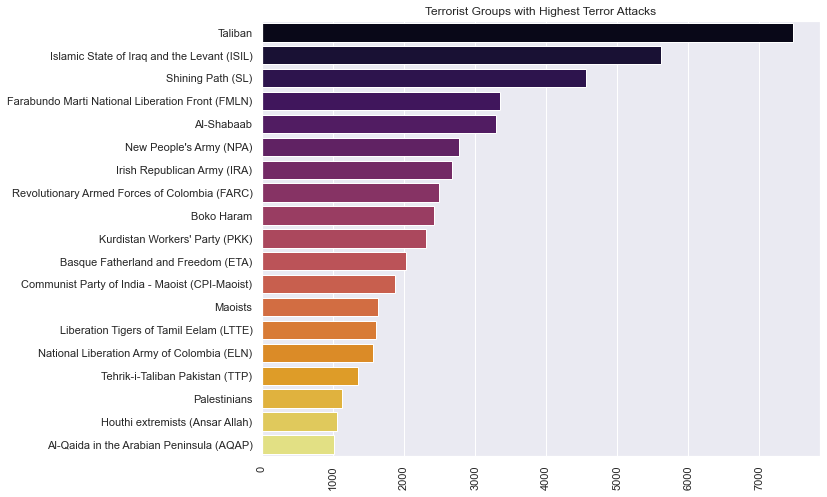

In [22]:
sns.barplot(terror['Group'].value_counts()[1:20].values,terror['Group'].value_counts()[1:20].index,palette=('inferno'))
plt.xticks(rotation=90)
fig=plt.gcf()
fig.set_size_inches(10,8)
plt.title('Terrorist Groups with Highest Terror Attacks')
plt.show()

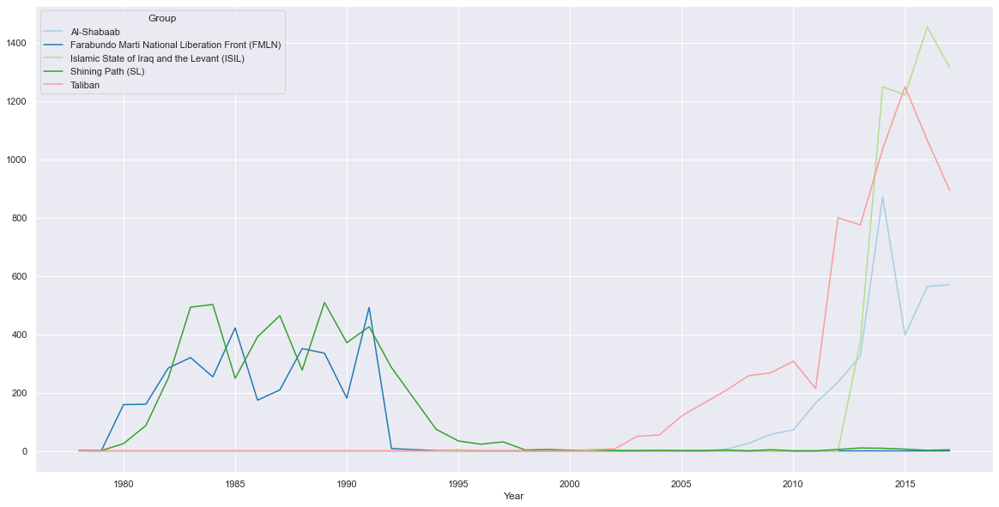

In [23]:
## Activity trend of top 5 of these groups 
top_groups10=terror[terror['Group'].isin(terror['Group'].value_counts()[1:6].index)]
pd.crosstab(top_groups10.Year,top_groups10.Group).plot(color=sns.color_palette('Paired',6))
fig=plt.gcf()
fig.set_size_inches(20,10)
plt.show()


###### The graph clearly shows that FMLN and Shining path were actvive in the span of 1980 to 1995.
###### Al-shabaab,Taliban,ISIL have been active from 2000-2017
### And one conclusion can be drawn that the major groups have been changing over the years 


### Top 25 worst Attacks between 1980 - 2016

In [24]:


df= terror.city.value_counts()
#print(df)
#remove row with unknwon index
df.drop(axis=1, index='Unknown', inplace=True)
#convert index to column
df =df.reset_index()
df.rename(columns={'index':'city','city':'attackcount'}, inplace= True)
df.sort_values(by=['attackcount'],ascending=False,  inplace= True)
top_target_cities = df.head(25)
top_target_cities

index =0;

#get lat long
df_city = terror[['city','Country']]
print(df_city.shape)
df_city.drop_duplicates(inplace= True)
print(df_city.shape)


#merge df

top_100 = top_target_cities.merge(df_city, left_on = 'city', right_on = 'city',  how = 'left')
top_100.drop_duplicates(subset=['city'],inplace=True)
top_100.sort_values(by='attackcount', ascending= False )
top_100.dropna( inplace = True)
top_100.reset_index(inplace=True) #to reset index from 0
top_100.drop(columns=['index'],inplace=True) #remove index deopped column
top_100

(181691, 2)
(38134, 2)


,city,attackcount,Country
0,Baghdad,7589,Iraq
1,Karachi,2652,Pakistan
2,Lima,2359,Peru
3,Mosul,2265,Iraq
4,Belfast,2171,United Kingdom
5,Santiago,1621,Chile
6,Mogadishu,1581,Somalia
7,San Salvador,1558,El Salvador
8,Istanbul,1048,Turkey
9,Athens,1019,Greece


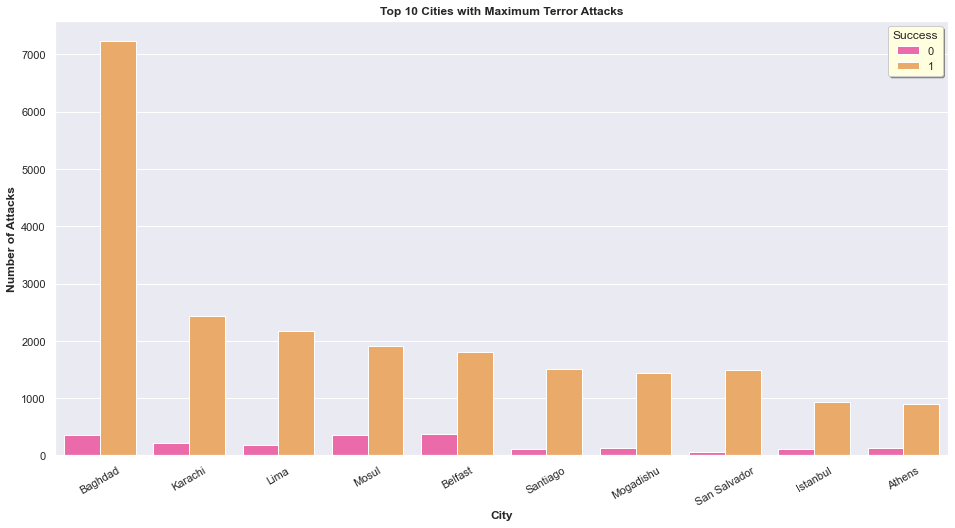

In [25]:
plt.figure(figsize=(16,8))
sns.set(style='darkgrid')
sns.countplot(x='city', hue='success', data=terror, order=terror['city'].value_counts().index[1:11], palette="spring")
#plt.xscale('log')
plt.ylabel("Number of Attacks", weight='bold')
plt.xlabel("City", weight='bold')
plt.legend(title='Success', shadow=True, facecolor='lightyellow')
plt.xticks(rotation=30)
plt.title('Top 10 Cities with Maximum Terror Attacks', weight='bold')
plt.show()


In [26]:

df_temp = pd.DataFrame(df[terror['success']==1].groupby(terror['Country']).size(), columns=['Successful'])
df_temp['Not_Successful'] = df[terror['success']==0].groupby(terror['Country']).size()

In [27]:
df_temp.fillna(0, inplace=True)


In [28]:
df_temp.reset_index(inplace=True)

In [29]:
df_temp.head()

,Country,Successful,Not_Successful
0,Afghanistan,15,1.0
1,Albania,1,0.0
2,Algeria,3,1.0
3,Andorra,1,0.0
4,Angola,52,0.0


In [30]:
df_temp['Sucess_Rate'] = df_temp['Successful']/df_temp['Not_Successful']
df_temp.head()

,Country,Successful,Not_Successful,Sucess_Rate
0,Afghanistan,15,1.0,15.0
1,Albania,1,0.0,inf
2,Algeria,3,1.0,3.0
3,Andorra,1,0.0,inf
4,Angola,52,0.0,inf


In [31]:
df_temp.head()

,Country,Successful,Not_Successful,Sucess_Rate
0,Afghanistan,15,1.0,15.0
1,Albania,1,0.0,inf
2,Algeria,3,1.0,3.0
3,Andorra,1,0.0,inf
4,Angola,52,0.0,inf


In [32]:
df_temp.columns

Index(['Country', 'Successful', 'Not_Successful', 'Sucess_Rate'], dtype='object')

In [33]:
df_temp2 = df_temp.sort_values(by='Sucess_Rate')[:10]

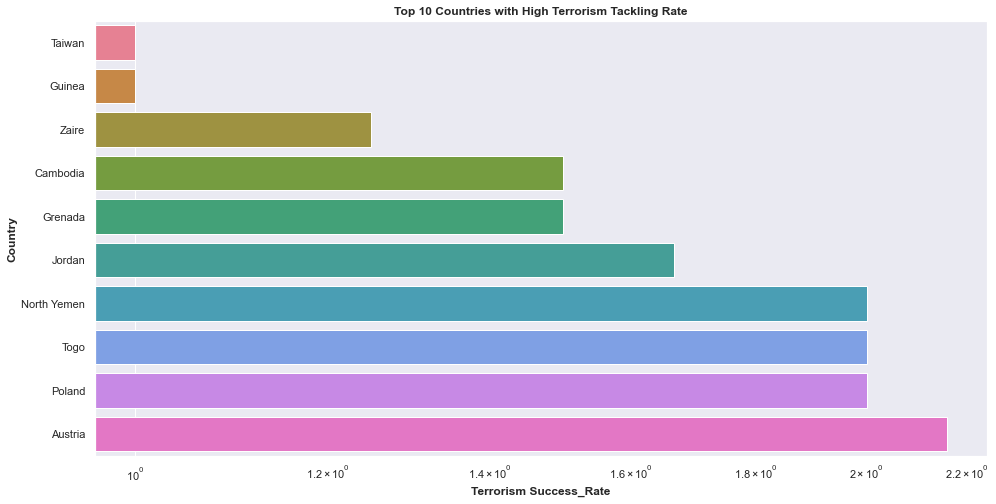

In [34]:
sns.set(style='darkgrid')
plt.figure(figsize=(16,8))
sns.barplot(y='Country', x='Sucess_Rate', data=df_temp2, palette='husl')

plt.xscale('log')
#plt.xticks(rotation=90)
plt.ylabel('Country', weight='bold')
plt.xlabel('Terrorism Success_Rate', weight='bold')
plt.title('Top 10 Countries with High Terrorism Tackling Rate', weight='bold')
plt.show()

In [35]:
terror.Group.value_counts()[:10]

Unknown                                             82782
Taliban                                              7478
Islamic State of Iraq and the Levant (ISIL)          5613
Shining Path (SL)                                    4555
Farabundo Marti National Liberation Front (FMLN)     3351
Al-Shabaab                                           3288
New People's Army (NPA)                              2772
Irish Republican Army (IRA)                          2671
Revolutionary Armed Forces of Colombia (FARC)        2487
Boko Haram                                           2418
Name: Group, dtype: int64

In [36]:
top10 = terror.groupby('Group')['Year'].count().nlargest(11).index

In [37]:
df_top10 = terror[terror['Group'].isin(top10)]


In [38]:
df_top10 = df_top10[~(df_top10['Group']=='Unknown')]

In [39]:
groupYear = pd.crosstab(df_top10.Year, df_top10.Group)
groupYear.head()

Group,Al-Shabaab,Boko Haram,Farabundo Marti National Liberation Front (FMLN),Irish Republican Army (IRA),Islamic State of Iraq and the Levant (ISIL),Kurdistan Workers' Party (PKK),New People's Army (NPA),Revolutionary Armed Forces of Colombia (FARC),Shining Path (SL),Taliban
Year,,,,,,,,,,
1970,0,0,0,7,0,0,2,0,0,0
1971,0,0,0,60,0,0,1,0,0,0
1972,0,0,0,162,0,0,0,0,0,0
1973,0,0,0,111,0,0,0,0,0,0
1974,0,0,0,113,0,0,0,0,0,0


In [40]:
df_temp = pd.DataFrame(df_top10[df_top10['success']==1].groupby(df_top10['Group']).size(), columns=['Successful'])
df_temp['Not_Successful'] = df_top10[df_top10['success']==0].groupby(df_top10['Group']).size()

In [41]:
df_temp.reset_index(inplace=True)

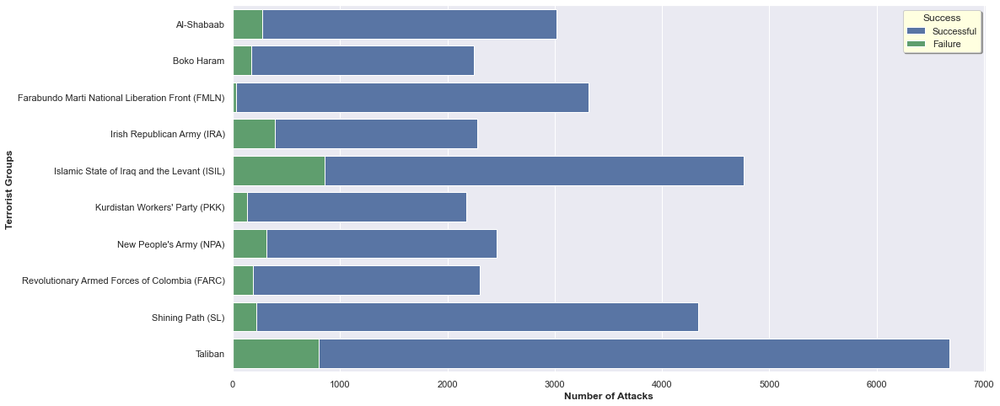

In [42]:
df_temp['Total_Attacks'] = df_temp['Successful'] + df_temp['Not_Successful']
ser1 = df_top10['Killed'].groupby(df_top10['Group']).sum()
ser2 = df_top10['Wounded'].groupby(df_top10['Group']).sum()
sns.set(style='darkgrid')
plt.figure(figsize=(16,8))
sns.barplot(y='Group', x='Successful', data=df_temp, color='b', label='Successful')
sns.barplot(y='Group', x='Not_Successful', data=df_temp, color='g', label='Failure')
#plt.yscale('log')
#plt.xticks(rotation=90)
plt.ylabel('Terrorist Groups', weight='bold')
plt.xlabel('Number of Attacks', weight='bold')
plt.legend(title='Success', shadow=True, facecolor='lightyellow')
plt.show()


## Analyzation on the most affected country(Iran)

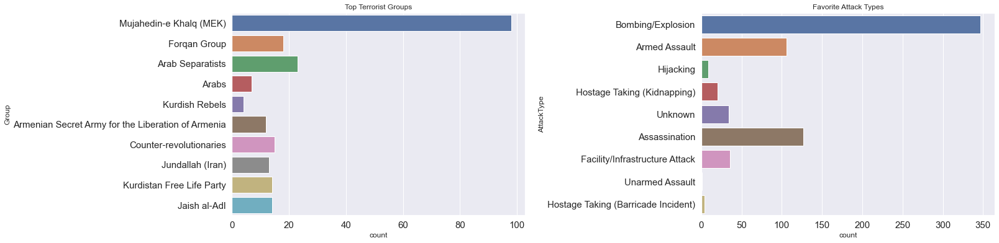

In [43]:
terror_iran=terror[terror['Country']=='Iran']
f,ax=plt.subplots(1,2,figsize=(22,6))
ind_groups=terror_iran['Group'].value_counts()[1:11].index
ind_groups=terror_iran[terror_iran['Group'].isin(ind_groups)]
sns.countplot(y='Group',data=ind_groups,ax=ax[0])
ax[0].set_title('Top Terrorist Groups')
sns.countplot(y='AttackType',data=terror_iran,ax=ax[1])
ax[1].set_title('Favorite Attack Types')
plt.subplots_adjust(hspace=0.3,wspace=0.6)
ax[0].tick_params(labelsize=15)
ax[1].tick_params(labelsize=15)
plt.show()


### World terrorism affect over the years 

In [44]:
fig = px.choropleth(terror.rename(columns={'casualities':'Casualities'}), 
                    locations='Country',
                    locationmode = 'country names',
                    color='Casualities', 
                    animation_frame='Year'
                   )
fig.update_layout(geo=dict(
                  showframe = True,
                  showcoastlines = True)
                )
fig.show()


####  It is visible that the Middle-East  and Southern-Asia are the regions with highest terrorist activites, not only in numbers, but also in casualities.
#### It is spreading largely across the globe but in the past few years, India, Pakistan and Afghanistan have witnessed an increase in such number of activities.
1. Terror Group:ISIL has incresed its activities significantly over the years.
2. Guenia and Taiwan have completely tackled high terrorist activities.(due to low terror activities)
Hostage target type activities saw a significant rise till 2010.
Taliban activities saw maximum casualities and usage of high amount of explosives.